# Understanding the modal shifting and travel delays under short-term transport disruption – a case study of London tube strike

In [33]:
import os
import pandas as pd
import numpy as np
from datetime import datetime
import geopandas as gpd
import matplotlib.pyplot as plt
from defined_methods import merge_csv, merge_csv_flow

# Data preparation

(500648.6269499996, 564876.9020499996, 153596.6433500004, 203188.04565000077)

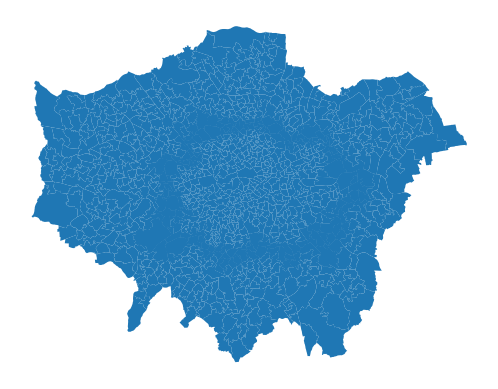

In [34]:
# read the administrative relationship encoding file
admin_rel = pd.read_csv(
    '/Users/zonghe/Library/CloudStorage/OneDrive-UnitedNationsDevelopmentProgramme/Paper/Tube Strike Behaviour/oa_lsoa_msoa_la_trans.csv')

# read the spatial administrative boundary files
oa = gpd.read_file(
    '/Users/zonghe/Library/CloudStorage/OneDrive-UnitedNationsDevelopmentProgramme/Paper/Tube Strike Behaviour/lon_oa.gpkg')
# lsoa = gpd.read_file(
#     '/Users/zonghe/Library/CloudStorage/OneDrive-UnitedNationsDevelopmentProgramme/Paper/Tube Strike Behaviour/lon_lsoa.gpkg')
msoa = gpd.read_file(
    '/Users/zonghe/Library/CloudStorage/OneDrive-UnitedNationsDevelopmentProgramme/Paper/Tube Strike Behaviour/lon_msoa.gpkg')

inoutter = '/Users/zonghe/Library/CloudStorage/OneDrive-UniversityCollegeLondon/Zonghe Ma/Zonghe Ma-STA-Investigating the relationship between modal shifting and road transport resilience under Tube strikes/Raw data/London administrative boundaries/lp-consultation-oct-2009-inner-outer-london-shp/lp-consultation-oct-2009-inner-outer-london.shp'
inoutter = gpd.read_file(inoutter)
inoutter.to_crs(epsg=27700, inplace=True)
msoa = gpd.sjoin(msoa, inoutter[['Boundary','geometry']], how='inner', predicate='intersects')
msoa.drop(columns=['index_right'], inplace=True)
msoa.rename(columns={'Boundary':'inout'}, inplace=True)

msoa.plot()
plt.axis('off')

In [35]:
msoa

,msoa21cd,msoa21nm,area,lad21cd,lad21nm,geometry,inout
0,E02000001,City of London 001,3.150420,E09000001,City of London,"MULTIPOLYGON (((532153.703 182165.155, 532158....",Inner London
14,E02000016,Barking and Dagenham 015,0.912838,E09000002,Barking and Dagenham,"MULTIPOLYGON (((544113.724 184901.614, 544129....",Inner London
18,E02000020,Barking and Dagenham 019,4.356232,E09000002,Barking and Dagenham,"MULTIPOLYGON (((545806.481 184158.048, 545806....",Inner London
47,E02000056,Barnet 033,3.227097,E09000003,Barnet,"MULTIPOLYGON (((526205.572 189702.450, 526206....",Inner London
52,E02000061,Barnet 038,1.586996,E09000003,Barnet,"MULTIPOLYGON (((525444.000 187924.001, 525463....",Inner London
...,...,...,...,...,...,...,...
982,E02006996,Newham 039,0.961216,E09000025,Newham,"MULTIPOLYGON (((539125.938 185568.297, 539127....",Outer London
988,E02007017,Redbridge 037,0.902721,E09000026,Redbridge,"MULTIPOLYGON (((547877.832 189038.795, 547890....",Outer London
989,E02007018,Redbridge 038,0.611776,E09000026,Redbridge,"MULTIPOLYGON (((547178.363 188495.275, 547179....",Outer London
990,E02007019,Redbridge 039,0.625062,E09000026,Redbridge,"MULTIPOLYGON (((545236.938 186626.031, 545228....",Outer London


## Behavioural data

In [36]:
device = merge_csv(
    '/Users/zonghe/Library/CloudStorage/OneDrive-UnitedNationsDevelopmentProgramme/Paper/Tube Strike Behaviour/travel_info_oa/device')
stay_time = merge_csv(
    '/Users/zonghe/Library/CloudStorage/OneDrive-UnitedNationsDevelopmentProgramme/Paper/Tube Strike Behaviour/travel_info_oa/stay time')
travel_time = merge_csv(
    '/Users/zonghe/Library/CloudStorage/OneDrive-UnitedNationsDevelopmentProgramme/Paper/Tube Strike Behaviour/travel_info_oa/travel time')
# drop the na values in the stay time dataset
stay_time = stay_time.dropna()
# convert the stay time from seconds to hours
stay_time['stay_time'] = stay_time['stay_time'].astype(int) / 3600

# Filtering for March 1, 2022, and March 3, 2022

device_313 = device[(device['date'] == '02/22/22') | (device['date'] == '03/01/22') | (
            device['date'] == '03/03/22')].copy().reset_index(drop=True)
device_313['date'] = pd.to_datetime(device_313['date'], format='%m/%d/%y').dt.strftime('%m/%d/%y')

stay_time_313 = stay_time[(stay_time['date'] == '02/22/22') | (stay_time['date'] == '03/01/22') | (
            stay_time['date'] == '03/03/22')].copy().reset_index(
    drop=True)
stay_time_313['date'] = pd.to_datetime(stay_time_313['date'], format='%m/%d/%y').dt.strftime('%m/%d/%y')

travel_time_313 = travel_time[
    (travel_time['date'] == '02/22/22') | (travel_time['date'] == '03/01/22') | (
                travel_time['date'] == '03/03/22')].copy().reset_index(drop=True)
travel_time_313['date'] = pd.to_datetime(travel_time_313['date'], format='%m/%d/%y').dt.strftime('%m/%d/%y')

### Device related behavioral test

In [70]:
# Device related behavioral test
test_device_lable = device_313['startid'].unique()[0]
# print(test_device_lable)
test_device = device_313[device_313['startid'] == test_device_lable]
# print(test_device)
test_device_stay = stay_time_313[stay_time_313['startid'] == test_device_lable]
# print(test_device_stay)
test_device_modes = travel_time_313[travel_time_313['startid'] == test_device_lable]
# print(test_device_travel)
# merge the test device status, stay time and travel time
test_device_status = pd.merge(test_device, test_device_stay, on=['startid', 'date', 'oa21cd', 'device_type'],
                              how='left')
test_device = test_device.drop_duplicates().reset_index(drop=True)
test_device_status

,startid,oa21cd,device_type,date,stay_time
0,1000015989590377328043415348373664771294182405...,E00018694,resident,03/01/22,8.210000
1,1000015989590377328043415348373664771294182405...,E00018691,passthrough,03/01/22,NaN
2,1000015989590377328043415348373664771294182405...,E00018688,passthrough,03/01/22,NaN
3,1000015989590377328043415348373664771294182405...,E00018694,resident,02/22/22,20.699167
4,1000015989590377328043415348373664771294182405...,E00018691,passthrough,02/22/22,NaN
5,1000015989590377328043415348373664771294182405...,E00018688,passthrough,02/22/22,NaN
6,1000015989590377328043415348373664771294182405...,E00185744,passthrough,02/22/22,NaN
7,1000015989590377328043415348373664771294182405...,E00018869,passthrough,02/22/22,NaN
8,1000015989590377328043415348373664771294182405...,E00018934,passthrough,02/22/22,NaN
9,1000015989590377328043415348373664771294182405...,E00018684,passthrough,02/22/22,NaN


In [71]:
test_device_modes

,stripid,startid,update_mode,time,distance,date
0,1.0,1000015989590377328043415348373664771294182405...,stationary,8.130556,0.019925,02/22/22
1,2.0,1000015989590377328043415348373664771294182405...,car,0.728611,4.099752,02/22/22
2,3.0,1000015989590377328043415348373664771294182405...,stationary,5.554167,0.097858,02/22/22
3,4.0,1000015989590377328043415348373664771294182405...,walks,0.256667,1.859487,02/22/22
4,5.0,1000015989590377328043415348373664771294182405...,stationary,0.493611,0.004711,02/22/22
5,6.0,1000015989590377328043415348373664771294182405...,walks,8.287222,4.080923,02/22/22
1331367,1.0,1000015989590377328043415348373664771294182405...,stationary,2.110000,0.433894,03/01/22
1331368,2.0,1000015989590377328043415348373664771294182405...,walks,0.365556,0.617287,03/01/22
1331369,3.0,1000015989590377328043415348373664771294182405...,stationary,6.100000,0.029396,03/01/22
1331370,4.0,1000015989590377328043415348373664771294182405...,walks,0.429167,0.921511,03/01/22


### Behavioural data processing

In [39]:
device_313_status = pd.merge(device_313, stay_time_313, on=['startid', 'date', 'oa21cd', 'device_type'], how='left')
device_313_status = device_313_status.drop_duplicates().reset_index(drop=True)

# insert the MSOA and LSOA column from 'admin_rel'
device_313_status = pd.merge(device_313_status, admin_rel[['oa21cd', 'msoa21cd', 'lsoa21cd']], on=['oa21cd'],
                             how='left')
device_313_status = device_313_status.drop_duplicates().reset_index(drop=True)

device_313_modes = travel_time_313.groupby(['stripid','startid', 'date', 'update_mode']).agg(
    {'time': 'sum', 'distance': 'sum'}).reset_index()

In [40]:
device_313_status

,startid,oa21cd,device_type,date,stay_time,msoa21cd,lsoa21cd
0,1000015989590377328043415348373664771294182405...,E00018694,resident,03/01/22,8.210000,E02006800,E01003714
1,1000037686428573366468895824408367961791352836...,E00008360,resident,03/01/22,18.706667,E02006786,E01032567
2,1000056811909521100485295490854336441641125953...,E00013578,resident,03/01/22,4.663889,E02000575,E01002726
3,1000064961804232476337777826703284484305799106...,E00007278,resident,03/01/22,23.500278,E02006793,E01001458
4,1000071212051388806025932869511590862120065353...,E00008696,resident,03/01/22,23.540278,E02000364,E01035640
...,...,...,...,...,...,...,...
7804985,9999986042492829152298314924974521522262434004...,E00000677,passthrough,02/22/22,NaN,E02000062,E01000141
7804986,9999986042492829152298314924974521522262434004...,E00000681,passthrough,02/22/22,NaN,E02000062,E01000141
7804987,9999986042492829152298314924974521522262434004...,E00000685,passthrough,02/22/22,NaN,E02000062,E01000141
7804988,9999991853406953377520742942162885721692630532...,E00014909,passthrough,02/22/22,NaN,E02000603,E01002960


In [41]:
device_313_modes

,stripid,startid,date,update_mode,time,distance
0,1.0,1000015989590377328043415348373664771294182405...,02/22/22,stationary,8.130556,0.019925
1,1.0,1000015989590377328043415348373664771294182405...,03/01/22,stationary,2.110000,0.433894
2,1.0,1000019095294824105134361584772501836692863196...,03/03/22,car,1.290000,25.116099
3,2.0,1000015989590377328043415348373664771294182405...,02/22/22,car,0.728611,4.099752
4,2.0,1000015989590377328043415348373664771294182405...,03/01/22,walks,0.365556,0.617287
...,...,...,...,...,...,...
1969527,575067.0,9999986042492829152298314924974521522262434004...,02/22/22,stationary,0.898889,0.167526
1969528,575068.0,9999986042492829152298314924974521522262434004...,02/22/22,car,1.614444,32.192981
1969529,575069.0,9999986042492829152298314924974521522262434004...,02/22/22,stationary,8.942778,0.075679
1969530,575070.0,9999991853406953377520742942162885721692630532...,02/22/22,car,0.012222,0.317155


# MSOA construction

## MSOA indicators

In [68]:
# merge dfs to aggrate at MSOA level
device_313_merged = pd.merge(device_313_status, device_313_modes, on=['date', 'startid'], how='left')
# device_313_merged.drop_duplicates(inplace=True)
device_313_merged

,startid,oa21cd,device_type,date,stay_time,msoa21cd,lsoa21cd,stripid,update_mode,time,distance
0,1000015989590377328043415348373664771294182405...,E00018694,resident,03/01/22,8.210000,E02006800,E01003714,1.0,stationary,2.110000,0.433894
1,1000015989590377328043415348373664771294182405...,E00018694,resident,03/01/22,8.210000,E02006800,E01003714,2.0,walks,0.365556,0.617287
2,1000015989590377328043415348373664771294182405...,E00018694,resident,03/01/22,8.210000,E02006800,E01003714,3.0,stationary,6.100000,0.029396
3,1000015989590377328043415348373664771294182405...,E00018694,resident,03/01/22,8.210000,E02006800,E01003714,4.0,walks,0.429167,0.921511
4,1000037686428573366468895824408367961791352836...,E00008360,resident,03/01/22,18.706667,E02006786,E01032567,15.0,stationary,14.724722,0.130730
...,...,...,...,...,...,...,...,...,...,...,...
65833710,9999986042492829152298314924974521522262434004...,E00000685,passthrough,02/22/22,NaN,E02000062,E01000141,575069.0,stationary,8.942778,0.075679
65833711,9999991853406953377520742942162885721692630532...,E00014909,passthrough,02/22/22,NaN,E02000603,E01002960,575070.0,car,0.012222,0.317155
65833712,9999991853406953377520742942162885721692630532...,E00014909,passthrough,02/22/22,NaN,E02000603,E01002960,575070.0,walks,0.000278,0.000000
65833713,9999991853406953377520742942162885721692630532...,E00009583,passthrough,02/22/22,NaN,E02000395,E01001916,575070.0,car,0.012222,0.317155


In [43]:
counts = device_313_merged.groupby(['date', 'msoa21cd', 'device_type']).size().reset_index(name='count')
counts = counts.pivot_table(index=['date', 'msoa21cd'], columns='device_type', values='count',
                            fill_value=0).reset_index()
counts.columns = [col if col in ['date', 'msoa21cd'] else f"{col}_count" for col in counts.columns]
counts

,date,msoa21cd,attraction_count,passthrough_count,resident_count
0,02/22/22,E02000001,31564,117189,1611
1,02/22/22,E02000002,769,13219,824
2,02/22/22,E02000003,1602,34949,751
3,02/22/22,E02000004,1246,10776,776
4,02/22/22,E02000005,1246,18210,719
...,...,...,...,...,...
3001,03/03/22,E02007111,3369,36448,418
3002,03/03/22,E02007112,512,16472,181
3003,03/03/22,E02007113,1011,39140,312
3004,03/03/22,E02007114,837,10161,294


In [44]:
counts_total = counts.groupby(['date']).agg({'resident_count': 'sum', 'attraction_count': 'sum',
                              'passthrough_count': 'sum'}).reset_index()
counts_total

,date,resident_count,attraction_count,passthrough_count
0,02/22/22,561472,1164248,20266462
1,03/01/22,531007,1065961,20437417
2,03/03/22,557258,1139118,20110772


In [45]:
# The units of 'time' and 'distance' are hours and kilometers, respectively

# Group by 'date' and 'msoa21xd', and aggregate 'time' and 'distance' by sum
triptd = device_313_merged.groupby(['date', 'msoa21cd', 'device_type']).agg(time_sum=('time', 'sum'), distance_sum=(
'distance', 'sum')).reset_index()
triptd[['time_sum', 'distance_sum']] = triptd[['time_sum', 'distance_sum']].round(2)

# Calculating mean values and renaming columns
triptd['time_mean'] = device_313_merged.groupby(['date', 'msoa21cd', 'device_type'])['time'].transform('mean').round(2)
triptd['distance_mean'] = device_313_merged.groupby(['date', 'msoa21cd', 'device_type'])['distance'].transform(
    'mean').round(2)
triptd = triptd.pivot_table(index=['date', 'msoa21cd'], columns='device_type',
                            values=['time_sum', 'time_mean', 'distance_sum', 'distance_mean'],
                            fill_value=0).reset_index()
triptd = triptd.rename_axis(None)
triptd.columns = [col if col in ['date', 'msoa21cd'] else f"{col[0]}_{col[1]}" for col in triptd.columns]
triptd.rename(columns={'date_': 'date', 'msoa21cd_': 'msoa21cd'}, inplace=True)
triptd_all = triptd.copy()

triptd = triptd[
    ['date', 'msoa21cd', 'distance_sum_resident', 'distance_mean_resident', 'time_sum_resident', 'time_mean_resident']]

triptd

,date,msoa21cd,distance_sum_resident,distance_mean_resident,time_sum_resident,time_mean_resident
0,02/22/22,E02000001,7124.88,2.97,2975.78,3.20
1,02/22/22,E02000002,2524.97,3.05,2326.70,3.02
2,02/22/22,E02000003,3166.46,3.05,2086.40,3.02
3,02/22/22,E02000004,2652.81,2.28,2030.57,2.55
4,02/22/22,E02000005,2161.48,2.28,2159.26,2.55
...,...,...,...,...,...,...
3001,03/03/22,E02007111,1034.06,4.75,943.30,2.85
3002,03/03/22,E02007112,368.06,4.75,712.24,2.85
3003,03/03/22,E02007113,875.24,2.26,773.72,2.75
3004,03/03/22,E02007114,698.69,2.26,716.83,2.75


In [46]:
triptd_total = triptd.groupby(['date']).agg({'distance_sum_resident': 'sum', 'distance_mean_resident': 'mean',
                              'time_sum_resident': 'sum', 'time_mean_resident': 'mean'}).reset_index()
triptd_total

,date,distance_sum_resident,distance_mean_resident,time_sum_resident,time_mean_resident
0,02/22/22,1746879.43,2.992754,1527447.24,2.808074
1,03/01/22,1607028.69,3.066906,1502381.53,2.815988
2,03/03/22,1678156.32,3.037216,1504081.66,2.842515


In [47]:
triprate = device_313_merged.groupby(['date', 'msoa21cd', 'device_type', 'update_mode']).size().reset_index(
    name='count')
triprate = triprate[triprate['device_type'] == 'resident']
triprate = triprate.pivot_table(index=['date', 'msoa21cd'], columns='update_mode', values='count',
                                fill_value=0).reset_index()
triprate = triprate.rename_axis(None)
triprate_all = triprate.copy()

triprate['public_transportation'] = triprate['tube'] + triprate['bus'] + triprate['train']
triprate['movement'] = triprate['public_transportation'] + triprate['car'] + triprate['cycle'] + triprate['walks']

triprate_all = triprate.copy()

triprate['trip_rate'] = (triprate['movement'] / (triprate['movement'] + triprate['public_transportation']) * 100).round(2)

triprate['tube_to_public'] = (triprate['tube'] / triprate['public_transportation'] * 100).round(2)

triprate = triprate[['date', 'msoa21cd', 'trip_rate','tube_to_public']]

triprate

update_mode,date,msoa21cd,trip_rate,tube_to_public
0,02/22/22,E02000001,86.91,33.09
1,02/22/22,E02000002,91.23,17.50
2,02/22/22,E02000003,91.43,27.78
3,02/22/22,E02000004,93.02,13.33
4,02/22/22,E02000005,93.35,32.00
...,...,...,...,...
3001,03/03/22,E02007111,90.27,36.00
3002,03/03/22,E02007112,87.25,15.38
3003,03/03/22,E02007113,94.19,20.00
3004,03/03/22,E02007114,91.33,33.33


In [48]:
# merge all indicators to one dataframe with geometry
map_msoa = pd.merge(counts, triptd, on=['date', 'msoa21cd'], how='left')
map_msoa = pd.merge(map_msoa, triprate, on=['date', 'msoa21cd'], how='left')
map_msoa =pd.merge(map_msoa, msoa[['msoa21cd', 'msoa21nm', 'inout','geometry']], on=['msoa21cd'], how='left')
map_msoa = gpd.GeoDataFrame(map_msoa, geometry='geometry', crs='EPSG:27700')
map_msoa

,date,msoa21cd,attraction_count,passthrough_count,resident_count,distance_sum_resident,distance_mean_resident,time_sum_resident,time_mean_resident,trip_rate,tube_to_public,msoa21nm,inout,geometry
0,02/22/22,E02000001,31564,117189,1611,7124.88,2.97,2975.78,3.20,86.91,33.09,City of London 001,Inner London,"MULTIPOLYGON (((532153.703 182165.155, 532158...."
1,02/22/22,E02000002,769,13219,824,2524.97,3.05,2326.70,3.02,91.23,17.50,Barking and Dagenham 001,Outer London,"MULTIPOLYGON (((548881.304 190819.980, 548881...."
2,02/22/22,E02000003,1602,34949,751,3166.46,3.05,2086.40,3.02,91.43,27.78,Barking and Dagenham 002,Outer London,"MULTIPOLYGON (((548958.555 189072.176, 548954...."
3,02/22/22,E02000004,1246,10776,776,2652.81,2.28,2030.57,2.55,93.02,13.33,Barking and Dagenham 003,Outer London,"MULTIPOLYGON (((551550.056 187364.705, 551528...."
4,02/22/22,E02000005,1246,18210,719,2161.48,2.28,2159.26,2.55,93.35,32.00,Barking and Dagenham 004,Outer London,"MULTIPOLYGON (((549237.051 187627.941, 549241...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3442,03/03/22,E02007111,3369,36448,418,1034.06,4.75,943.30,2.85,90.27,36.00,Hackney 033,Inner London,"MULTIPOLYGON (((533467.193 183307.131, 533467...."
3443,03/03/22,E02007112,512,16472,181,368.06,4.75,712.24,2.85,87.25,15.38,Tower Hamlets 034,Inner London,"MULTIPOLYGON (((539048.000 181080.547, 539044...."
3444,03/03/22,E02007113,1011,39140,312,875.24,2.26,773.72,2.75,94.19,20.00,Tower Hamlets 035,Inner London,"MULTIPOLYGON (((538560.000 181083.000, 538575...."
3445,03/03/22,E02007114,837,10161,294,698.69,2.26,716.83,2.75,91.33,33.33,Tower Hamlets 036,Inner London,"MULTIPOLYGON (((538406.587 180300.310, 538431...."


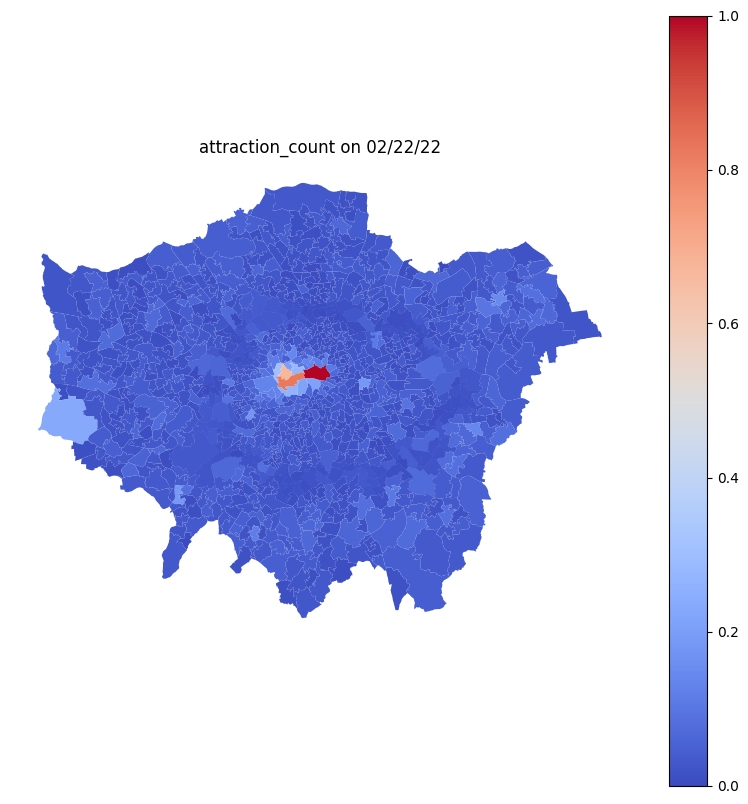

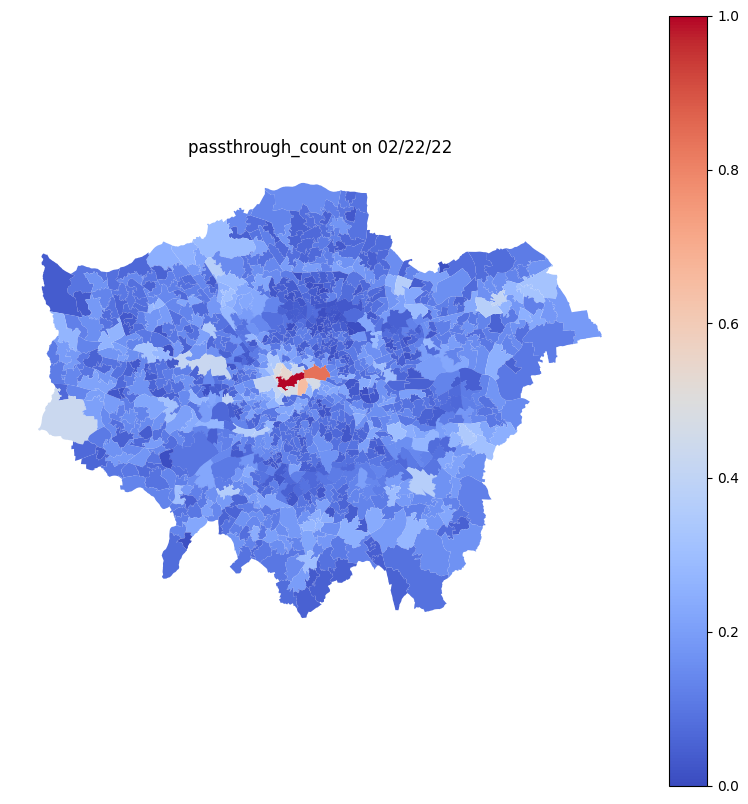

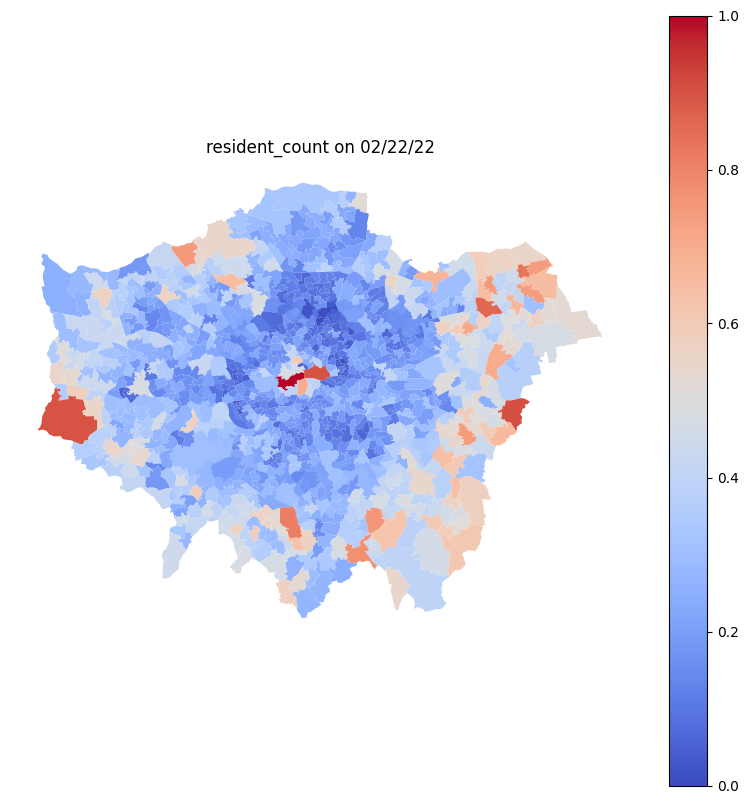

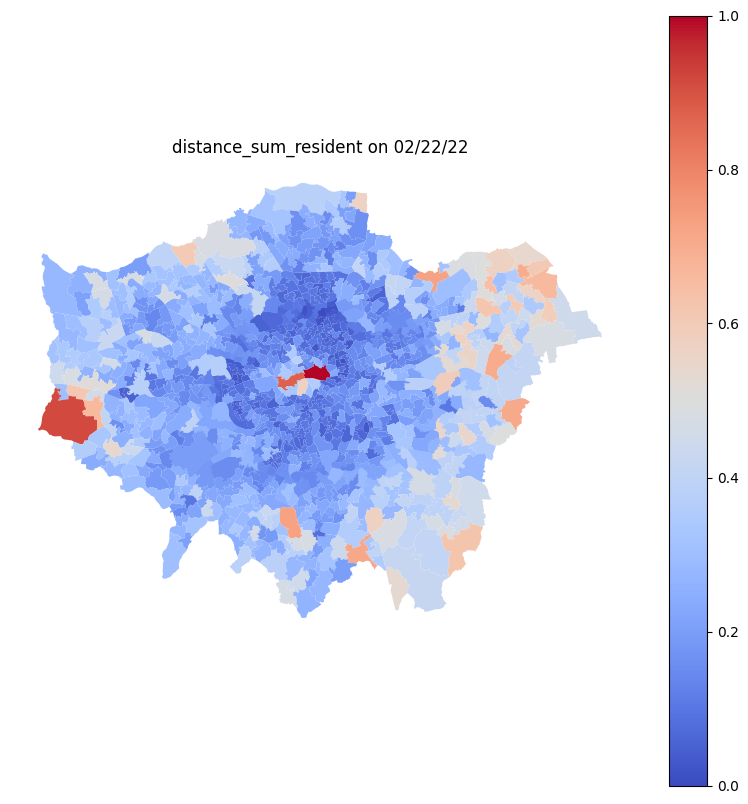

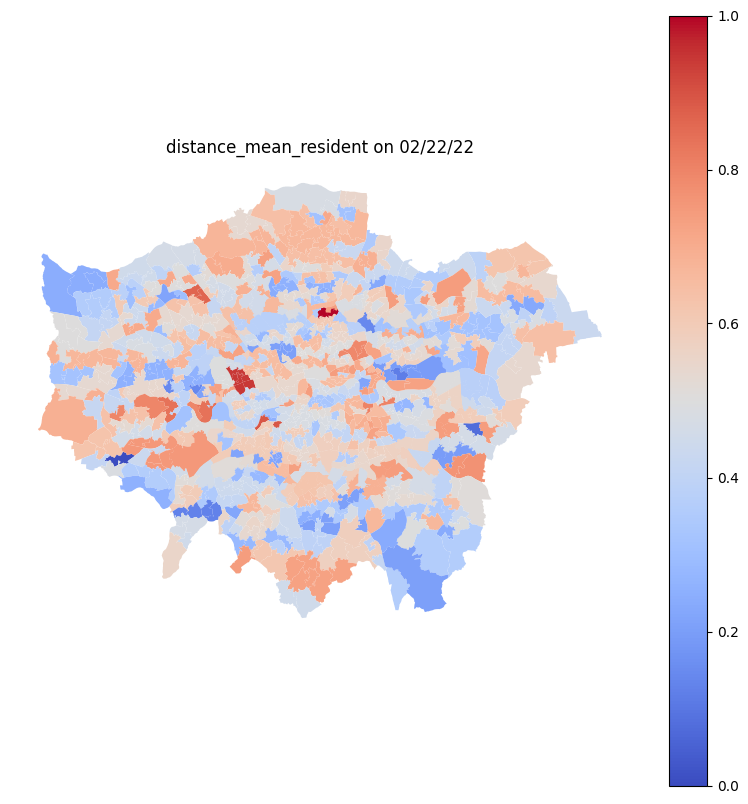

...

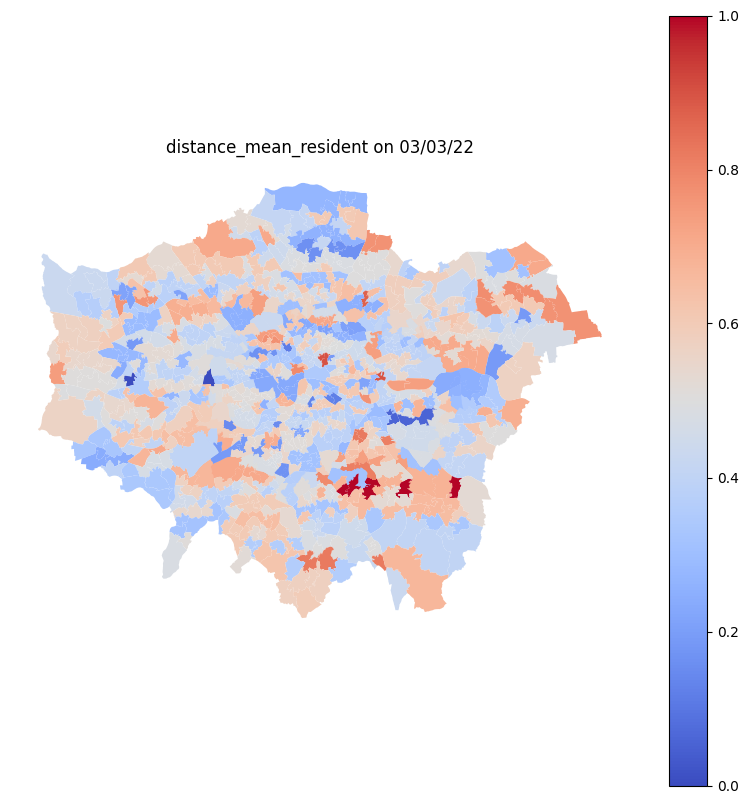

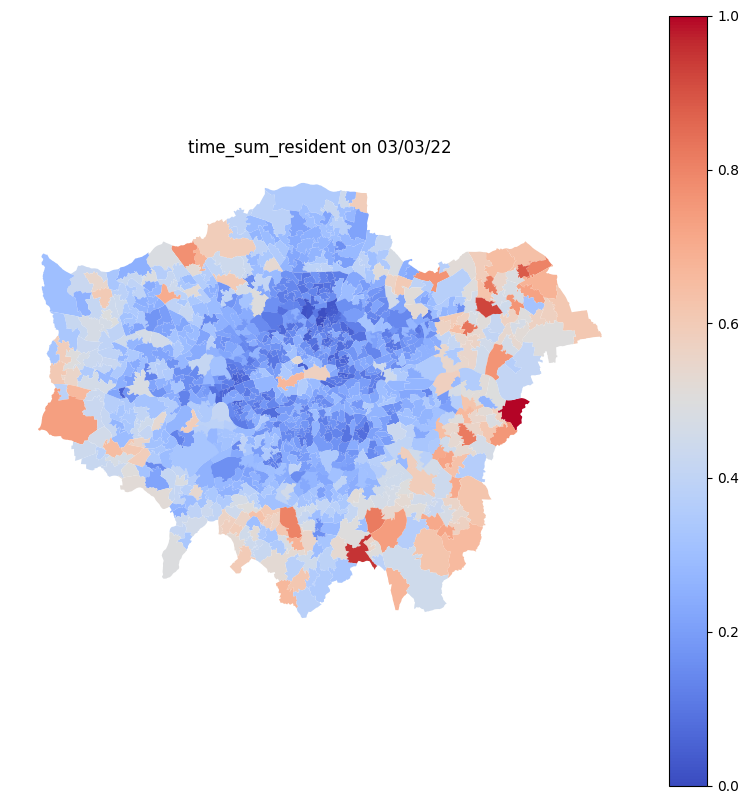

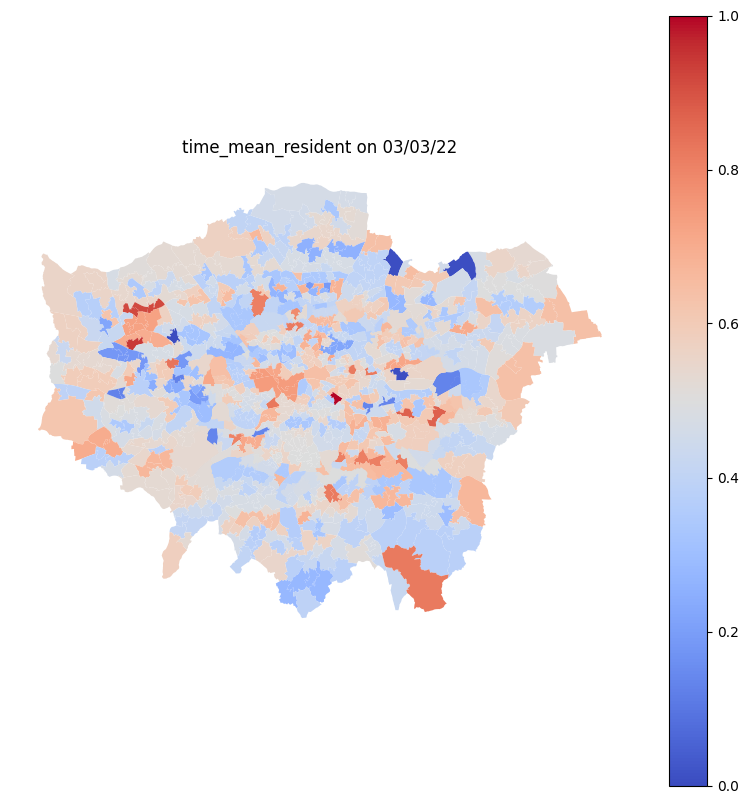

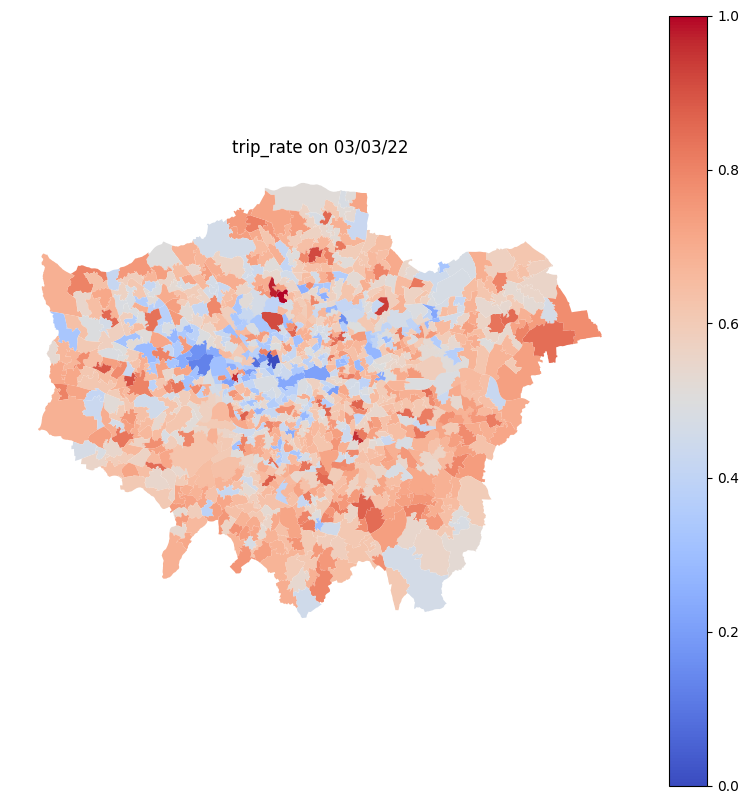

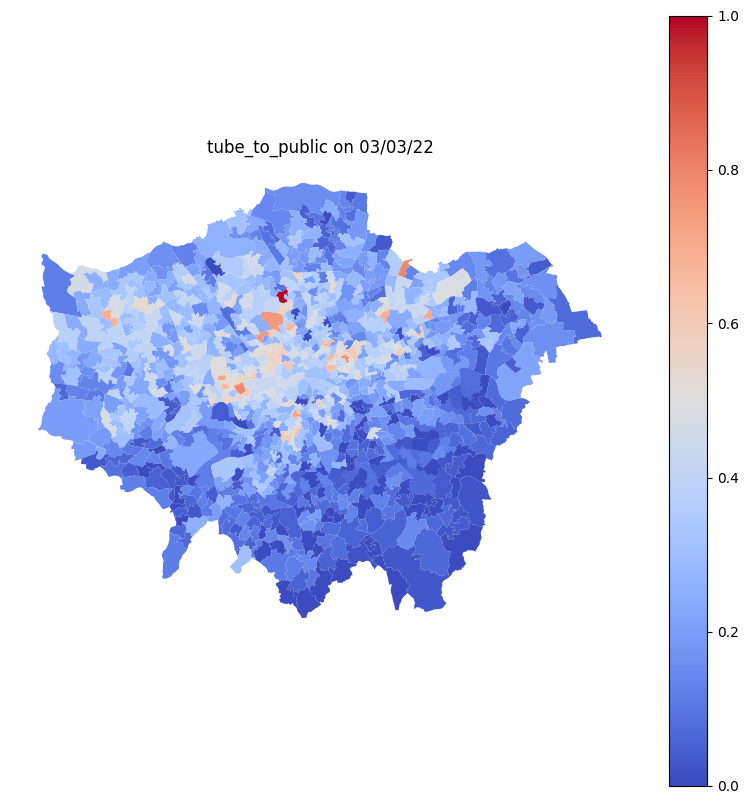

In [53]:
def normalize_plot(gdf, column, date, cmap='coolwarm', legend=True):
    # Filter the GeoDataFrame for the specified date
    geo_df = gdf[gdf['date'] == date].copy()

    # Normalize the column
    min_val = geo_df[column].min()
    max_val = geo_df[column].max()
    normalized_col_name = f"{column}_normalized"
    geo_df[normalized_col_name] = (geo_df[column] - min_val) / (max_val - min_val)

    # Plotting
    geo_df.plot(figsize=(10, 10), column=normalized_col_name, cmap=cmap, legend=legend)

    # Remove axis for better visual presentation
    plt.title(f"{column} on {date}")
    plt.axis('off')
    plt.show()

# Get unique dates
unique_dates = map_msoa['date'].unique()

# Columns to plot, excluding non-numeric and non-essential columns
columns_to_plot = [col for col in map_msoa.columns if col not in ['date', 'msoa21cd', 'msoa21nm', 'inout', 'geometry']]

# Loop over each unique date and each column
for date in unique_dates:
    for col in columns_to_plot:
        normalize_plot(map_msoa, col, date)


## LISA

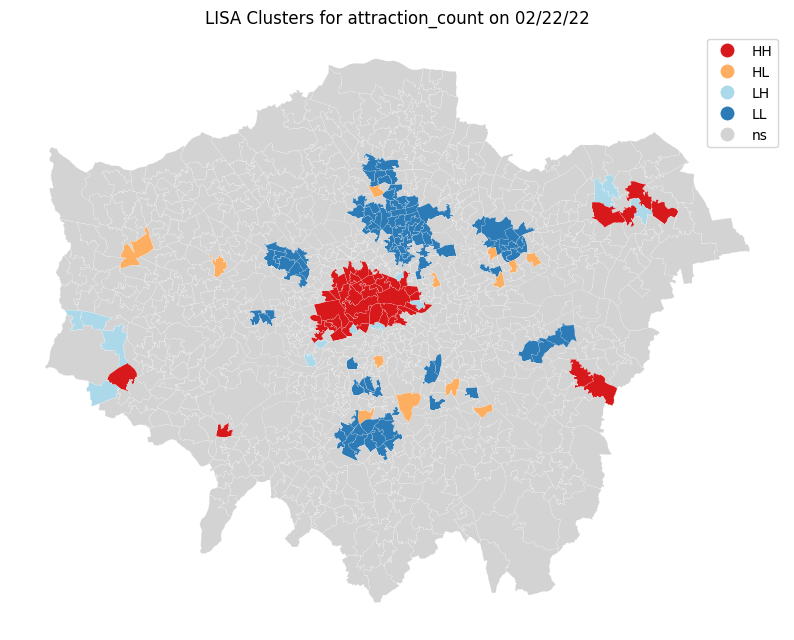

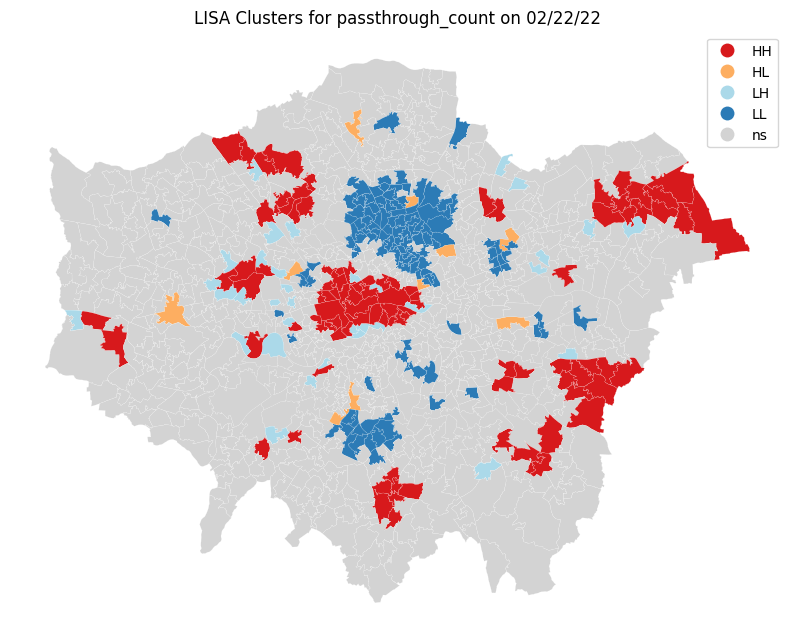

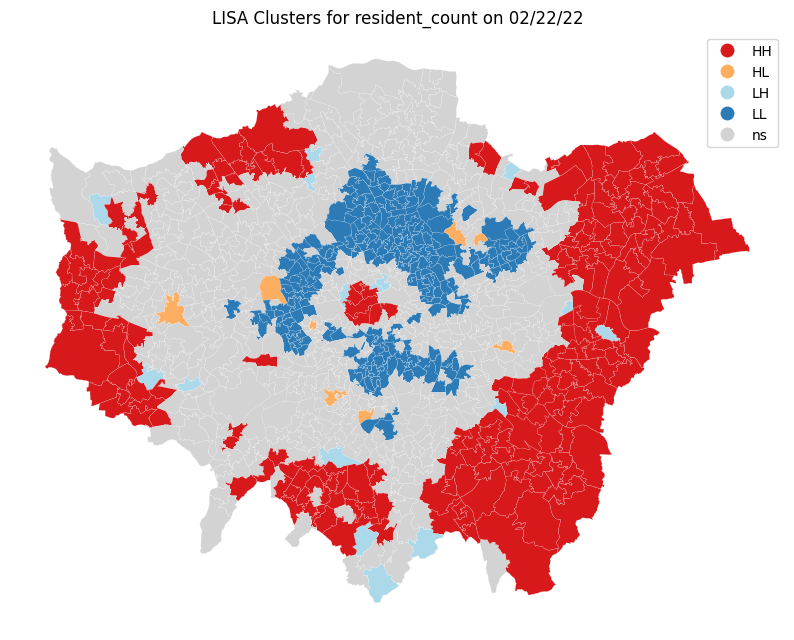

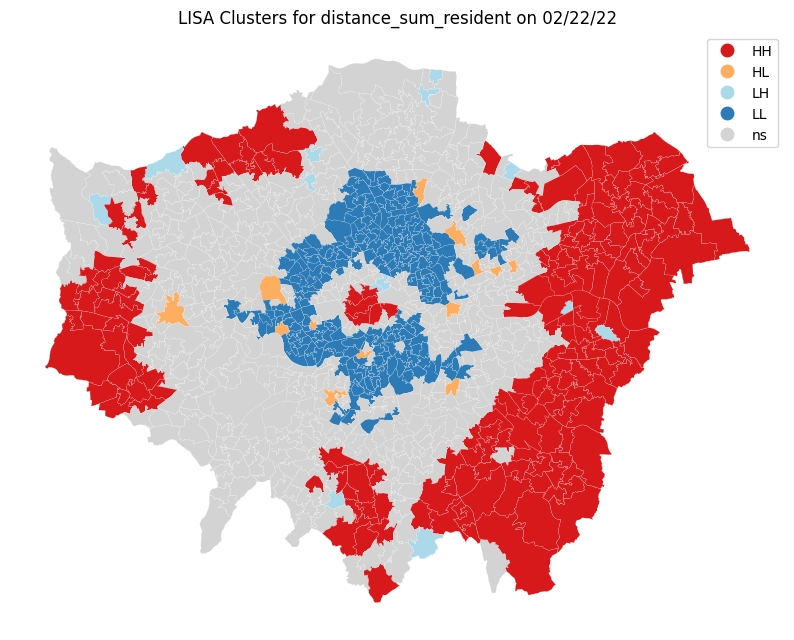

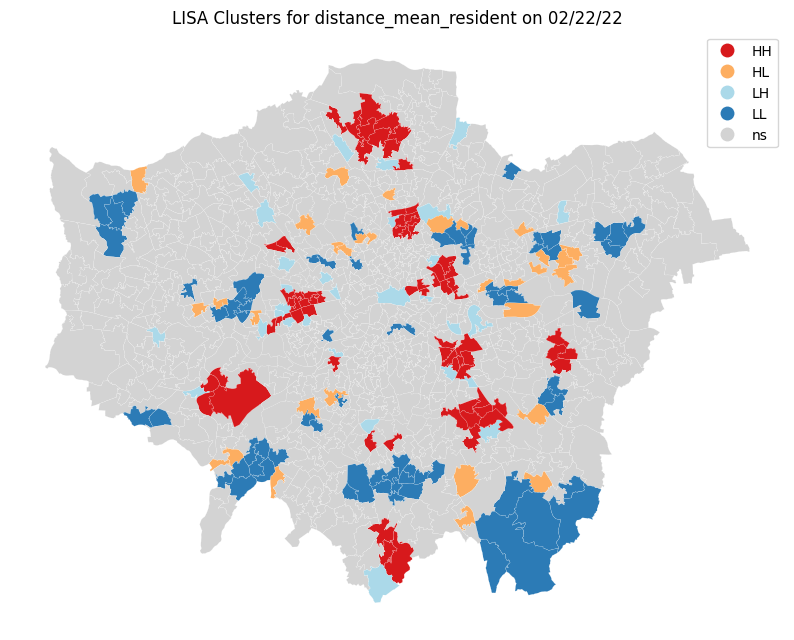

...

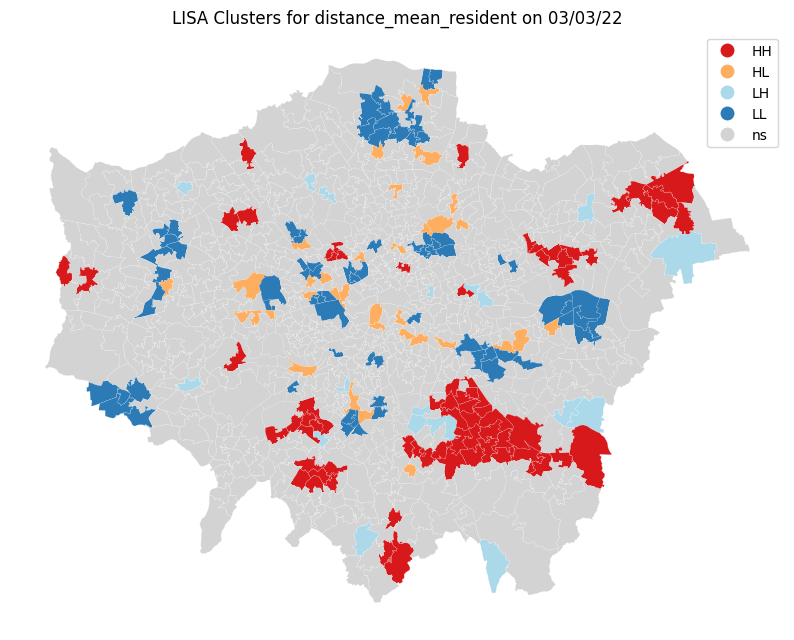

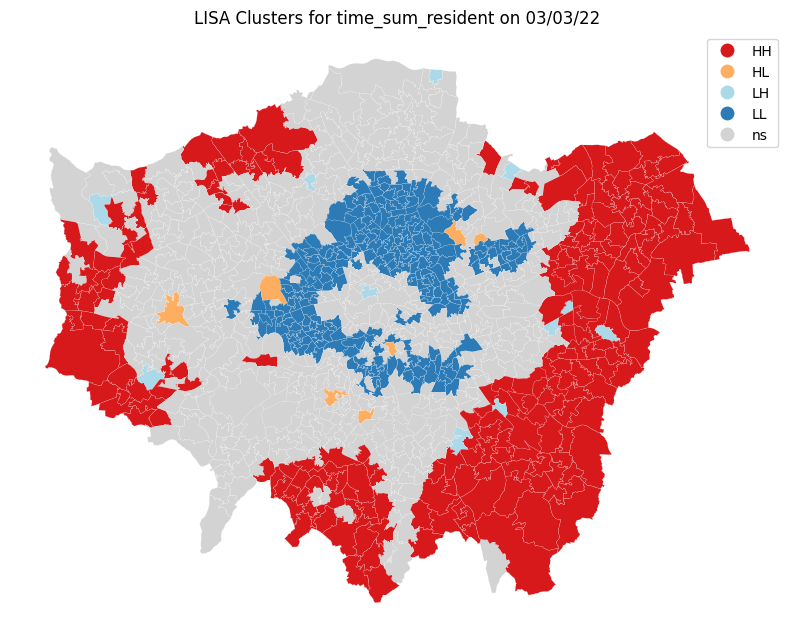

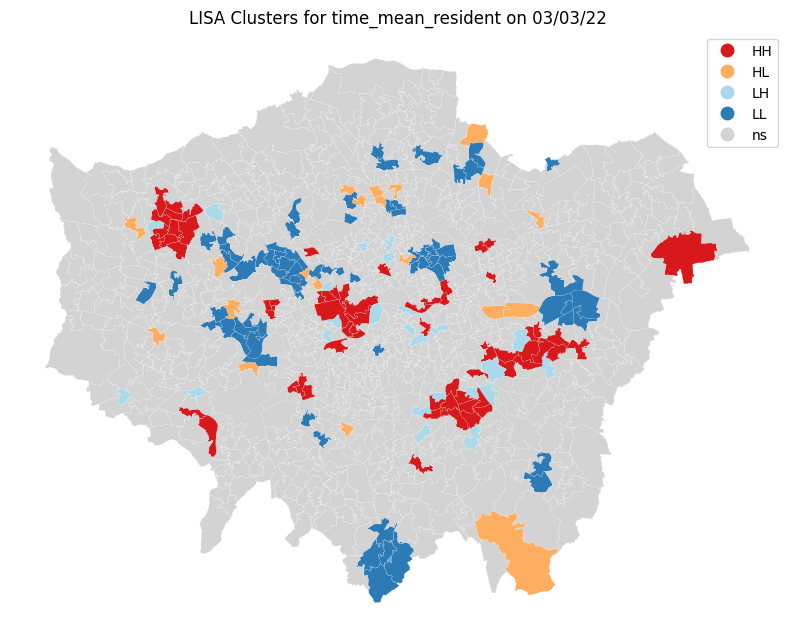

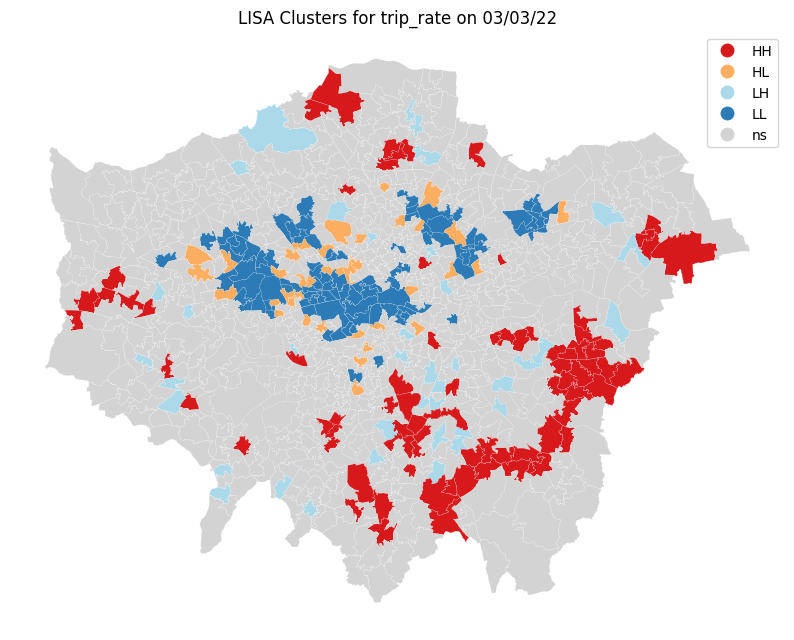

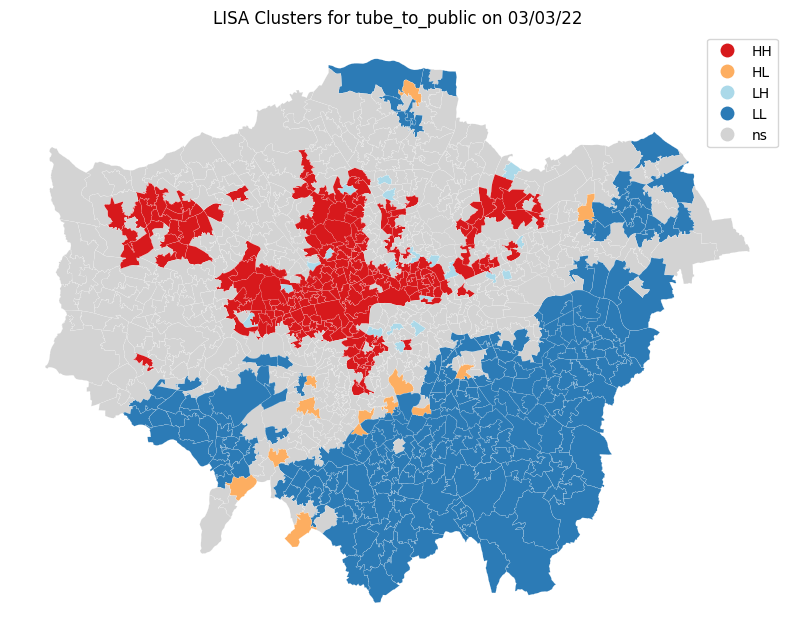

In [55]:
import matplotlib.pyplot as plt
import libpysal as lps
from splot.esda import lisa_cluster
import esda
import warnings
from shapely.errors import ShapelyDeprecationWarning

warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=ShapelyDeprecationWarning)

# Load your GeoDataFrame and ensure it's exploded to handle MultiPolygons
gdf = map_msoa.copy()
gdf = gdf.explode(index_parts=True).reset_index(drop=True)

variables = ['attraction_count', 'passthrough_count',
             'resident_count', 'distance_sum_resident', 'distance_mean_resident',
             'time_sum_resident', 'time_mean_resident', 'trip_rate',
             'tube_to_public']

# Get unique dates
unique_dates = gdf['date'].unique()

# Loop through each date
for date in unique_dates:
    # Filter the GeoDataFrame for the current date
    gdf_date = gdf[gdf['date'] == date]

    # Create a spatial weights matrix for the filtered GeoDataFrame
    w_date = lps.weights.Queen.from_dataframe(gdf_date)

    # Loop through each variable and run LISA for the current date
    for variable in variables:
        # Check if the variable column has only one unique value or all NaN values
        if gdf_date[variable].nunique() > 1 and not gdf_date[variable].isna().all():
            lisa = esda.Moran_Local(gdf_date[variable].fillna(0), w_date)
            
            # Plot LISA clusters
            fig, ax = plt.subplots(figsize=(10, 10))
            lisa_cluster(lisa, gdf_date, ax=ax)
            ax.set_title(f"LISA Clusters for {variable} on {date}")
            plt.show()
        else:
            print(f"Skipping {variable} on {date} due to insufficient unique values or all NaN values.")



# OD Graph

In [111]:
test = device_313_merged.copy()
test = test[test['date'] == '03/01/22']


test[test['startid'] == test['startid'].unique()[0]]


,startid,oa21cd,device_type,date,stay_time,msoa21cd,lsoa21cd,stripid,update_mode,time,distance
0,1000015989590377328043415348373664771294182405...,E00018694,resident,03/01/22,8.21,E02006800,E01003714,1.0,stationary,2.110000,0.433894
1,1000015989590377328043415348373664771294182405...,E00018694,resident,03/01/22,8.21,E02006800,E01003714,2.0,walks,0.365556,0.617287
2,1000015989590377328043415348373664771294182405...,E00018694,resident,03/01/22,8.21,E02006800,E01003714,3.0,stationary,6.100000,0.029396
3,1000015989590377328043415348373664771294182405...,E00018694,resident,03/01/22,8.21,E02006800,E01003714,4.0,walks,0.429167,0.921511
1596968,1000015989590377328043415348373664771294182405...,E00018691,passthrough,03/01/22,NaN,E02006800,E01003714,1.0,stationary,2.110000,0.433894
1596969,1000015989590377328043415348373664771294182405...,E00018691,passthrough,03/01/22,NaN,E02006800,E01003714,2.0,walks,0.365556,0.617287
1596970,1000015989590377328043415348373664771294182405...,E00018691,passthrough,03/01/22,NaN,E02006800,E01003714,3.0,stationary,6.100000,0.029396
1596971,1000015989590377328043415348373664771294182405...,E00018691,passthrough,03/01/22,NaN,E02006800,E01003714,4.0,walks,0.429167,0.921511
1596972,1000015989590377328043415348373664771294182405...,E00018688,passthrough,03/01/22,NaN,E02006800,E01003714,1.0,stationary,2.110000,0.433894
1596973,1000015989590377328043415348373664771294182405...,E00018688,passthrough,03/01/22,NaN,E02006800,E01003714,2.0,walks,0.365556,0.617287


In [112]:
device_313[(device_313['startid'] == device_313['startid'].unique()[0]) & (device_313['date'] == '03/01/22')]

,startid,oa21cd,device_type,date
0,1000015989590377328043415348373664771294182405...,E00018694,resident,03/01/22
196142,1000015989590377328043415348373664771294182405...,E00018691,passthrough,03/01/22
196143,1000015989590377328043415348373664771294182405...,E00018688,passthrough,03/01/22


In [113]:
stay_time_313[(stay_time_313['startid'] == stay_time_313['startid'].unique()[0]) & (stay_time_313['date'] == '03/01/22')]

,startid,oa21cd,device_type,stay_time,date
270117,1000015989590377328043415348373664771294182405...,E00018694,resident,8.21,03/01/22


In [114]:
travel_time_313[(travel_time_313['startid'] == travel_time_313['startid'].unique()[0]) & (travel_time_313['date'] == '03/01/22')]

,stripid,startid,update_mode,time,distance,date
1331367,1.0,1000015989590377328043415348373664771294182405...,stationary,2.110000,0.433894,03/01/22
1331368,2.0,1000015989590377328043415348373664771294182405...,walks,0.365556,0.617287,03/01/22
1331369,3.0,1000015989590377328043415348373664771294182405...,stationary,6.100000,0.029396,03/01/22
1331370,4.0,1000015989590377328043415348373664771294182405...,walks,0.429167,0.921511,03/01/22
